In [1]:
!python -c "import monai" || pip install -q "monai-weekly[nibabel, tqdm]"
!python -c "import matplotlib" || pip install -q matplotlib
%matplotlib inline

In [2]:
"""
0: background,
1: sacrum,
2: right_hip,
3: left_hip,
4: lumbar_vertebra.        
"""        

'\n0: background,\n1: sacrum,\n2: right_hip,\n3: left_hip,\n4: lumbar_vertebra.        \n'

In [3]:
from monai.utils import first, set_determinism
from monai.transforms import (
    AddChanneld,
    AsDiscrete,
    AsDiscreted,
    EnsureChannelFirstd,
    Compose,
    Resized,
    CropForegroundd,
    LoadImaged,
    Orientationd,
    Activationsd,
    RandCropByPosNegLabeld,
    ScaleIntensityRanged,
    Spacingd,
    ScaleIntensityd,
    SaveImaged,
    EnsureTyped,
    EnsureType,
    Invertd,
)
from monai.handlers.utils import from_engine
from monai.networks.nets import UNet
from monai.networks.layers import Norm
from monai.metrics import DiceMetric
from monai.losses import DiceLoss
from monai.losses import DiceCELoss
from monai.inferers import sliding_window_inference
from monai.data import CacheDataset, DataLoader, Dataset, decollate_batch
from monai.config import print_config
from monai.apps import download_and_extract
import torch
import matplotlib.pyplot as plt
import tempfile
import shutil
import os
import glob
from monai.optimizers import Novograd
from monai.utils import get_torch_version_tuple, set_determinism
from ignite.handlers import EarlyStopping, ModelCheckpoint

print_config()


MONAI version: 0.9.dev2209
Numpy version: 1.21.5
Pytorch version: 1.10.2
MONAI flags: HAS_EXT = False, USE_COMPILED = False
MONAI rev id: 9db6e543d6090a3256f20695c1d3224df8cbbc0e
MONAI __file__: C:\Users\Hripsime\anaconda3\envs\abys\lib\site-packages\monai\__init__.py

Optional dependencies:
Pytorch Ignite version: 0.4.8
Nibabel version: 3.2.2
scikit-image version: 0.19.2
Pillow version: 9.0.1
Tensorboard version: 2.8.0
gdown version: 4.2.1
TorchVision version: 0.11.3
tqdm version: 4.63.0
lmdb version: 1.3.0
psutil version: 5.9.0
pandas version: 1.4.1
einops version: 0.4.0
transformers version: 4.16.2
mlflow version: 1.23.1

For details about installing the optional dependencies, please visit:
    https://docs.monai.io/en/latest/installation.html#installing-the-recommended-dependencies



## Setup data directory

In [4]:
root_dir  = '../projects/CTPelvic1K_data/'

data_image = os.path.join(root_dir, 'train_images')
data_mask = os.path.join(root_dir, 'train_masks')


## Set dataset path

In [5]:
train_images = sorted(glob.glob(os.path.join(data_image, "*data.nii.gz")))
train_labels = sorted(glob.glob(os.path.join(data_mask, "*mask_4label.nii.gz")))

data_dicts = [ {"image": image_name, "mask": label_name} for image_name, label_name in zip(train_images, train_labels) ]
train_files, val_files = data_dicts[:-6], data_dicts[-6:]

In [6]:
set_determinism(seed=0)

In [7]:
train_transforms = Compose(
    [
        LoadImaged(keys=["image", "mask"]),
        EnsureChannelFirstd(keys=["image", "mask"]),
        Orientationd(keys=["image", "mask"], axcodes="RAS"),
        Spacingd(keys=["image", "mask"], pixdim=(1.0, 1.0, 1.0), mode=("bilinear", "nearest")),
        ScaleIntensityRanged(keys=["image"], a_min=-120, a_max=360,b_min=0.0, b_max=1.0, clip=True,),
        CropForegroundd(keys=["image", "mask"], source_key="image"),
        #DataStatsd(keys=["image", "label"], prefix='Data', data_type=True, data_shape=True, value_range=True, data_value=False),
        
        RandCropByPosNegLabeld(
            keys=["image", "mask"],
            label_key="mask",
            spatial_size=(128, 128, 128),
            pos=1,
            neg=1,
            num_samples=4,
            image_key="image",
            image_threshold=0,
        ),
        
        EnsureTyped(keys=["image", "mask"]),
    ]
)
val_transforms = Compose(
    [
        LoadImaged(keys=["image", "mask"]),
        EnsureChannelFirstd(keys=["image", "mask"]),
        Orientationd(keys=["image", "mask"], axcodes="RAS"),
        Spacingd(keys=["image", "mask"], pixdim=(1.0, 1.0, 1.0), mode=("bilinear", "nearest")),
        ScaleIntensityRanged(keys=["image"], a_min=-120, a_max=360,b_min=0.0, b_max=1.0, clip=True,),
        CropForegroundd(keys=["image", "mask"], source_key="image"),
        EnsureTyped(keys=["image", "mask"]),
    ]
)

In [8]:
train_ds = CacheDataset(data=train_files, transform=train_transforms, cache_rate=1.0, num_workers=0)
train_loader = DataLoader(train_ds, batch_size=2, shuffle=True, num_workers=0)

val_ds = CacheDataset(data=val_files, transform=val_transforms, cache_rate=1.0, num_workers=0)
val_loader = DataLoader(val_ds, batch_size=1, num_workers=0)


Loading dataset: 100%|███████████████████████████████████████████████████████████████████| 6/6 [00:52<00:00,  8.83s/it]


image shape: torch.Size([398, 272, 280]), mask shape: torch.Size([398, 272, 280])


<function matplotlib.pyplot.show(close=None, block=None)>

<Figure size 432x288 with 0 Axes>

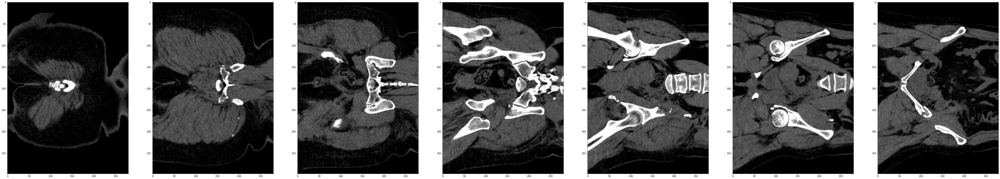

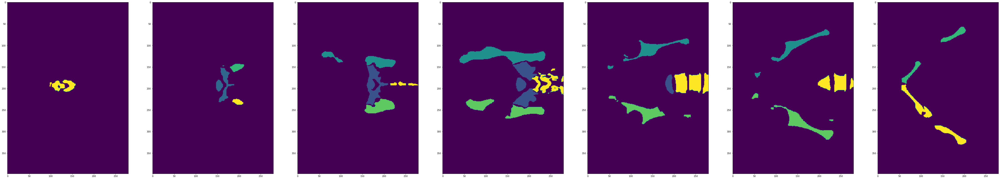

In [9]:
check_ds = Dataset(data=val_files, transform=val_transforms)
check_loader = DataLoader(check_ds, batch_size=1)
check_data = first(check_loader)
image, label = (check_data["image"][0][0], check_data["mask"][0][0])
print(f"image shape: {image.shape}, mask shape: {label.shape}")


fig = plt.figure()
fig, (ax1, ax2 ,ax3, ax4, ax5, ax6, ax7) = plt.subplots(nrows=1, ncols=7, figsize=(80, 50))
fig, (ax8, ax9, ax10, ax11, ax12, ax13, ax14) = plt.subplots(nrows=1, ncols=7, figsize=(80, 50))

ax1.imshow(image[:, 60, :], cmap="gray")
ax2.imshow(image[:, 80, :], cmap="gray")
ax3.imshow(image[:, 100, :], cmap="gray")
ax4.imshow(image[:, 120, :], cmap="gray")
ax5.imshow(image[:, 140, :], cmap="gray")
ax6.imshow(image[:, 160, :], cmap="gray")
ax7.imshow(image[:, 180, :], cmap="gray")

ax8.imshow(label[:, 60, :])
ax9.imshow(label[:, 80, :])
ax10.imshow(label[:, 100, :])
ax11.imshow(label[:, 120, :])
ax12.imshow(label[:, 140, :])
ax13.imshow(label[:, 160, :])
ax14.imshow(label[:, 180, :])

plt.show

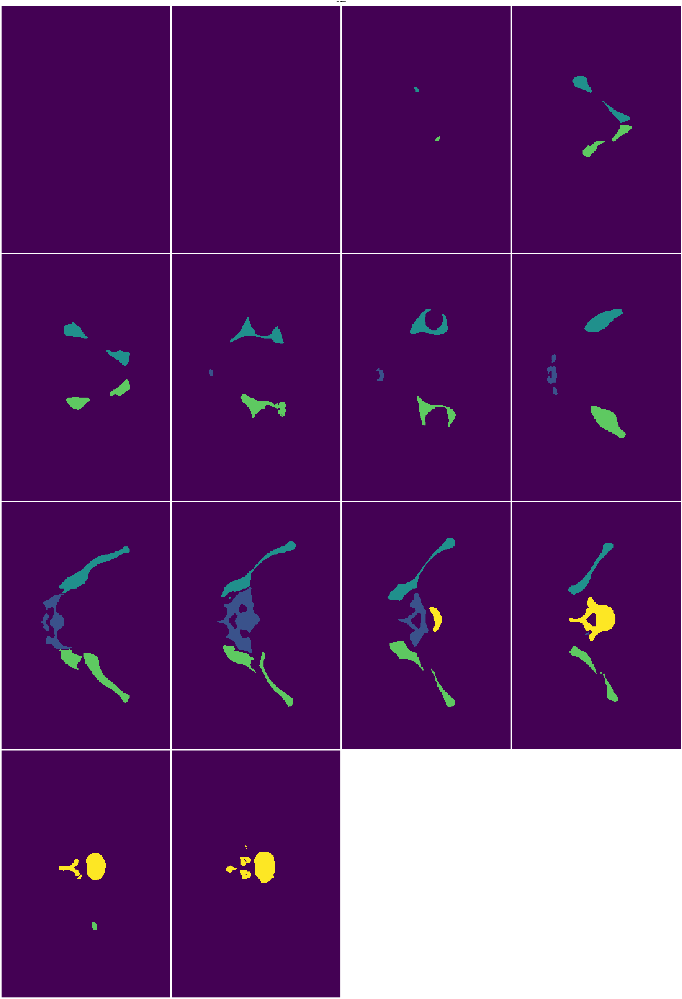

(<Figure size 7200x7200 with 1 Axes>,
 array([[nan, nan, nan, ..., nan, nan, nan],
        [nan,  0.,  0., ...,  0.,  0., nan],
        [nan,  0.,  0., ...,  0.,  0., nan],
        ...,
        [nan,  0.,  0., ..., nan, nan, nan],
        [nan,  0.,  0., ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]], dtype=float32))

In [10]:
from monai.visualize import blend_images, matshow3d, plot_2d_or_3d_image

matshow3d(volume=check_data['mask'], fig=None, title="input mask", figsize=(100, 100), every_n=20, frame_dim=-1,show=True,)
#cmap="gray",

In [11]:
ret = blend_images(image=check_data["image"][0], label=check_data["mask"][0], alpha=0.5, cmap="jet", rescale_arrays=True)
print(ret.shape)

torch.Size([3, 398, 272, 280])


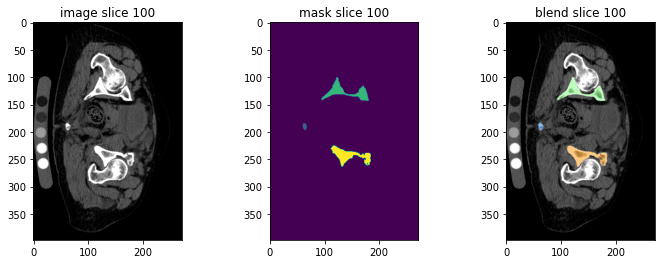

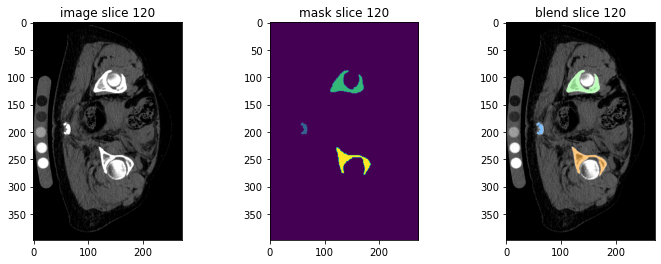

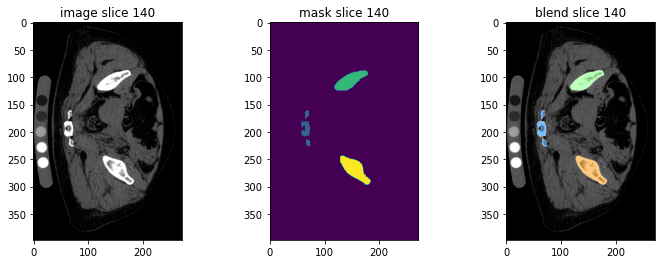

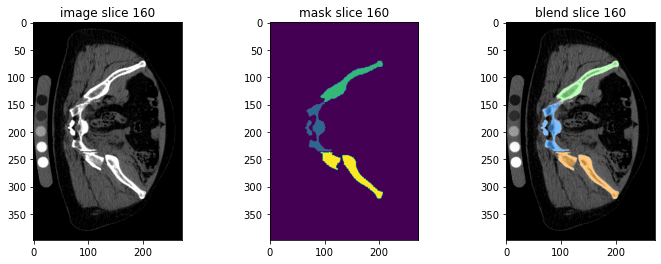

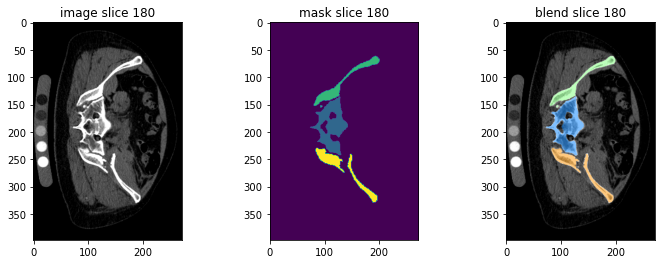

In [12]:
for i in range(5, 10):
    # plot the slice 50 - 100 of image, label and blend result
    slice_index = 20 * i
    plt.figure("blend image and mask", (12, 4))
    plt.subplot(1, 3, 1)
    plt.title(f"image slice {slice_index}")
    plt.imshow(check_data["image"][0, 0, :, :, slice_index], cmap="gray")
    plt.subplot(1, 3, 2)
    plt.title(f"mask slice {slice_index}")
    plt.imshow(check_data["mask"][0, 0, :, :, slice_index])
    plt.subplot(1, 3, 3)
    plt.title(f"blend slice {slice_index}")
    # switch the channel dim to the last dim
    plt.imshow(torch.moveaxis(ret[:, :, :, slice_index], 0, -1))
    plt.show()

In [13]:
import gc #garbage collector
gc.collect()
torch.cuda.empty_cache()
torch.cuda.synchronize()

## Create Model, Loss, Optimizer

In [14]:
from monai.losses import DiceCELoss

# standard PyTorch program style: create UNet, DiceLoss and Adam optimizer

VAL_AMP = True #Automatic mixed precision to accelerate training speed and reduce a memory usage
learning_rate = 2e-4

device=torch.device("cuda:0")     
#device=torch.device("cpu")      
model = UNet(
    spatial_dims=3,
    in_channels=1,
    out_channels=5,
    channels=(16, 32, 64, 128, 256),
    strides=(2, 2, 2, 2),
    num_res_units=2,
    norm=Norm.BATCH,
).to(device)

#loss_function = DiceLoss(to_onehot_y=True, softmax=True)
loss_function = DiceCELoss(to_onehot_y=True, softmax=True) 

optimizer = torch.optim.Adam(model.parameters(), learning_rate)
#optimizer = Novograd(model.parameters(), learning_rate * 10)
dice_metric = DiceMetric(include_background=False, reduction="mean")


# define inference method
def inference(input):
    def _compute(input):
        return sliding_window_inference(
            inputs=input,
            roi_size=(160, 160, 160),
            sw_batch_size=4,
            predictor=model,
            overlap=0.5,
        )

    if VAL_AMP:
        with torch.cuda.amp.autocast():
            return _compute(input)
    else:
        return _compute(input)
    
# use amp to accelerate training
scaler = torch.cuda.amp.GradScaler()
# enable cuDNN benchmark
torch.backends.cudnn.benchmark = True    

## Execute a typical PyTorch training process

In [15]:
max_epochs = 400
val_interval = 1
best_metric = -1
best_metric_epoch = -1

epoch_loss_values = []
metric_values = []
post_pred = Compose([EnsureType(), AsDiscrete(argmax=True, to_onehot=5)])
post_label = Compose([EnsureType(), AsDiscrete(to_onehot=5)])

start_time = time.time()

for epoch in range(max_epochs):
    print("-" * 10)
    print(f"epoch {epoch + 1}/{max_epochs}")
    
    model.train()
    epoch_loss = 0
    step = 0
    for batch_data in train_loader:
        step += 1
        inputs, labels = (batch_data["image"].to(device),batch_data["mask"].to(device),)
        optimizer.zero_grad()
        with torch.cuda.amp.autocast():
            outputs = model(inputs)
            loss = loss_function(outputs, labels)
        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()
        
        epoch_loss += loss.item()
        print(
            f"{step}/{len(train_ds) // train_loader.batch_size}, "
            f"train_loss: {loss.item():.4f}")
    epoch_loss /= step
    epoch_loss_values.append(epoch_loss)
    print(f"epoch {epoch + 1} average loss: {epoch_loss:.4f}")

    if (epoch + 1) % val_interval == 0:
        model.eval()
        with torch.no_grad():
            for val_data in val_loader:
                val_inputs, val_labels = (val_data["image"].to(device),val_data["mask"].to(device),)
                
                val_outputs = inference(val_inputs)
                val_outputs = [post_pred(i) for i in decollate_batch(val_outputs)]
                val_labels = [post_label(i) for i in decollate_batch(val_labels)]
                
                # compute metric for current iteration
                dice_metric(y_pred=val_outputs, y=val_labels)

            # aggregate the final mean dice result
            metric = dice_metric.aggregate().item()
            
            # reset the status for next validation round
            dice_metric.reset()

            metric_values.append(metric)
            if metric > best_metric:
                best_metric = metric
                best_metric_epoch = epoch + 1
                torch.save(model.state_dict(), os.path.join(root_dir, "best_metric_model.pth"))
                print("saved new best metric model")
            
            print(
                f"current epoch: {epoch + 1} current mean dice: {metric:.4f}"
                f"\nbest mean dice: {best_metric:.4f} "
                f"at epoch: {best_metric_epoch}"
            )

----------
epoch 1/400
1/14, train_loss: 2.7121
2/14, train_loss: 2.6680
3/14, train_loss: 2.6056
4/14, train_loss: 2.5586
5/14, train_loss: 2.5337
6/14, train_loss: 2.5250
7/14, train_loss: 2.4730
8/14, train_loss: 2.4466
9/14, train_loss: 2.4276
10/14, train_loss: 2.3729
11/14, train_loss: 2.3783
12/14, train_loss: 2.3567
13/14, train_loss: 2.3660
14/14, train_loss: 2.2918
15/14, train_loss: 2.3037
epoch 1 average loss: 2.4680
saved new best metric model
current epoch: 1 current mean dice: 0.0894
best mean dice: 0.0894 at epoch: 1
----------
epoch 2/400
1/14, train_loss: 2.2842
2/14, train_loss: 2.2626
3/14, train_loss: 2.2726
4/14, train_loss: 2.2813
5/14, train_loss: 2.2201
6/14, train_loss: 2.1985
7/14, train_loss: 2.1830
8/14, train_loss: 2.1561
9/14, train_loss: 2.1601
10/14, train_loss: 2.1715
11/14, train_loss: 2.0958
12/14, train_loss: 2.1173
13/14, train_loss: 2.1252
14/14, train_loss: 2.0926
15/14, train_loss: 2.0152
epoch 2 average loss: 2.1757
saved new best metric model


8/14, train_loss: 0.7995
9/14, train_loss: 0.7766
10/14, train_loss: 0.7354
11/14, train_loss: 0.7308
12/14, train_loss: 0.7584
13/14, train_loss: 0.7537
14/14, train_loss: 0.7675
15/14, train_loss: 0.9470
epoch 16 average loss: 0.7823
current epoch: 16 current mean dice: 0.5591
best mean dice: 0.5855 at epoch: 15
----------
epoch 17/400
1/14, train_loss: 0.8320
2/14, train_loss: 0.7662
3/14, train_loss: 0.7712
4/14, train_loss: 0.7227
5/14, train_loss: 0.7750
6/14, train_loss: 0.7658
7/14, train_loss: 0.7487
8/14, train_loss: 0.7685
9/14, train_loss: 0.6963
10/14, train_loss: 0.8128
11/14, train_loss: 0.8466
12/14, train_loss: 0.7144
13/14, train_loss: 0.7537
14/14, train_loss: 0.7542
15/14, train_loss: 0.6988
epoch 17 average loss: 0.7618
saved new best metric model
current epoch: 17 current mean dice: 0.6149
best mean dice: 0.6149 at epoch: 17
----------
epoch 18/400
1/14, train_loss: 0.7242
2/14, train_loss: 0.7573
3/14, train_loss: 0.8259
4/14, train_loss: 0.6801
5/14, train_loss:

saved new best metric model
current epoch: 31 current mean dice: 0.8930
best mean dice: 0.8930 at epoch: 31
----------
epoch 32/400
1/14, train_loss: 0.4745
2/14, train_loss: 0.5334
3/14, train_loss: 0.4868
4/14, train_loss: 0.5195
5/14, train_loss: 0.5067
6/14, train_loss: 0.5538
7/14, train_loss: 0.5984
8/14, train_loss: 0.4320
9/14, train_loss: 0.5108
10/14, train_loss: 0.5747
11/14, train_loss: 0.5269
12/14, train_loss: 0.6006
13/14, train_loss: 0.6204
14/14, train_loss: 0.5121
15/14, train_loss: 0.5597
epoch 32 average loss: 0.5340
current epoch: 32 current mean dice: 0.8806
best mean dice: 0.8930 at epoch: 31
----------
epoch 33/400
1/14, train_loss: 0.5780
2/14, train_loss: 0.5117
3/14, train_loss: 0.5391
4/14, train_loss: 0.5103
5/14, train_loss: 0.5120
6/14, train_loss: 0.5837
7/14, train_loss: 0.5005
8/14, train_loss: 0.5180
9/14, train_loss: 0.5179
10/14, train_loss: 0.6351
11/14, train_loss: 0.4917
12/14, train_loss: 0.4594
13/14, train_loss: 0.4907
14/14, train_loss: 0.587

6/14, train_loss: 0.3793
7/14, train_loss: 0.4636
8/14, train_loss: 0.5574
9/14, train_loss: 0.5104
10/14, train_loss: 0.4903
11/14, train_loss: 0.4420
12/14, train_loss: 0.4600
13/14, train_loss: 0.6116
14/14, train_loss: 0.5137
15/14, train_loss: 0.3486
epoch 47 average loss: 0.4748
current epoch: 47 current mean dice: 0.8956
best mean dice: 0.9294 at epoch: 45
----------
epoch 48/400
1/14, train_loss: 0.4248
2/14, train_loss: 0.4888
3/14, train_loss: 0.4393
4/14, train_loss: 0.4816
5/14, train_loss: 0.4136
6/14, train_loss: 0.5139
7/14, train_loss: 0.4840
8/14, train_loss: 0.5124
9/14, train_loss: 0.4808
10/14, train_loss: 0.5502
11/14, train_loss: 0.4482
12/14, train_loss: 0.4877
13/14, train_loss: 0.4325
14/14, train_loss: 0.5006
15/14, train_loss: 0.5880
epoch 48 average loss: 0.4831
current epoch: 48 current mean dice: 0.9025
best mean dice: 0.9294 at epoch: 45
----------
epoch 49/400
1/14, train_loss: 0.4042
2/14, train_loss: 0.5564
3/14, train_loss: 0.5606
4/14, train_loss: 0.

1/14, train_loss: 0.4191
2/14, train_loss: 0.4431
3/14, train_loss: 0.4349
4/14, train_loss: 0.3601
5/14, train_loss: 0.4580
6/14, train_loss: 0.4001
7/14, train_loss: 0.4251
8/14, train_loss: 0.4020
9/14, train_loss: 0.3780
10/14, train_loss: 0.3435
11/14, train_loss: 0.3670
12/14, train_loss: 0.3939
13/14, train_loss: 0.3418
14/14, train_loss: 0.3686
15/14, train_loss: 0.5124
epoch 63 average loss: 0.4032
current epoch: 63 current mean dice: 0.9327
best mean dice: 0.9437 at epoch: 62
----------
epoch 64/400
1/14, train_loss: 0.4071
2/14, train_loss: 0.4039
3/14, train_loss: 0.5027
4/14, train_loss: 0.3115
5/14, train_loss: 0.4308
6/14, train_loss: 0.3538
7/14, train_loss: 0.3905
8/14, train_loss: 0.3682
9/14, train_loss: 0.4095
10/14, train_loss: 0.3522
11/14, train_loss: 0.3670
12/14, train_loss: 0.3224
13/14, train_loss: 0.4123
14/14, train_loss: 0.4858
15/14, train_loss: 0.5204
epoch 64 average loss: 0.4025
current epoch: 64 current mean dice: 0.9373
best mean dice: 0.9437 at epoc

1/14, train_loss: 0.3574
2/14, train_loss: 0.4669
3/14, train_loss: 0.3548
4/14, train_loss: 0.4200
5/14, train_loss: 0.5567
6/14, train_loss: 0.3544
7/14, train_loss: 0.3527
8/14, train_loss: 0.4520
9/14, train_loss: 0.4274
10/14, train_loss: 0.2776
11/14, train_loss: 0.4138
12/14, train_loss: 0.3465
13/14, train_loss: 0.4373
14/14, train_loss: 0.4919
15/14, train_loss: 0.4965
epoch 79 average loss: 0.4137
current epoch: 79 current mean dice: 0.9446
best mean dice: 0.9499 at epoch: 77
----------
epoch 80/400
1/14, train_loss: 0.4452
2/14, train_loss: 0.3962
3/14, train_loss: 0.4333
4/14, train_loss: 0.3765
5/14, train_loss: 0.3778
6/14, train_loss: 0.4142
7/14, train_loss: 0.3963
8/14, train_loss: 0.4787
9/14, train_loss: 0.3730
10/14, train_loss: 0.4920
11/14, train_loss: 0.4087
12/14, train_loss: 0.4146
13/14, train_loss: 0.3857
14/14, train_loss: 0.3223
15/14, train_loss: 0.4041
epoch 80 average loss: 0.4079
current epoch: 80 current mean dice: 0.9475
best mean dice: 0.9499 at epoc

current epoch: 94 current mean dice: 0.9539
best mean dice: 0.9541 at epoch: 92
----------
epoch 95/400
1/14, train_loss: 0.3696
2/14, train_loss: 0.3369
3/14, train_loss: 0.3628
4/14, train_loss: 0.3856
5/14, train_loss: 0.4424
6/14, train_loss: 0.2164
7/14, train_loss: 0.2504
8/14, train_loss: 0.4746
9/14, train_loss: 0.3562
10/14, train_loss: 0.3505
11/14, train_loss: 0.3756
12/14, train_loss: 0.4685
13/14, train_loss: 0.2742
14/14, train_loss: 0.4734
15/14, train_loss: 0.3977
epoch 95 average loss: 0.3690
saved new best metric model
current epoch: 95 current mean dice: 0.9555
best mean dice: 0.9555 at epoch: 95
----------
epoch 96/400
1/14, train_loss: 0.3936
2/14, train_loss: 0.4209
3/14, train_loss: 0.3789
4/14, train_loss: 0.3960
5/14, train_loss: 0.3506
6/14, train_loss: 0.2396
7/14, train_loss: 0.2711
8/14, train_loss: 0.4571
9/14, train_loss: 0.3956
10/14, train_loss: 0.2880
11/14, train_loss: 0.3834
12/14, train_loss: 0.3130
13/14, train_loss: 0.4076
14/14, train_loss: 0.341

11/14, train_loss: 0.3471
12/14, train_loss: 0.2671
13/14, train_loss: 0.2861
14/14, train_loss: 0.3753
15/14, train_loss: 0.3315
epoch 110 average loss: 0.3447
current epoch: 110 current mean dice: 0.9495
best mean dice: 0.9561 at epoch: 97
----------
epoch 111/400
1/14, train_loss: 0.3263
2/14, train_loss: 0.3720
3/14, train_loss: 0.4293
4/14, train_loss: 0.2516
5/14, train_loss: 0.3073
6/14, train_loss: 0.4754
7/14, train_loss: 0.3964
8/14, train_loss: 0.5179
9/14, train_loss: 0.3369
10/14, train_loss: 0.2729
11/14, train_loss: 0.3259
12/14, train_loss: 0.2392
13/14, train_loss: 0.2592
14/14, train_loss: 0.4121
15/14, train_loss: 0.3546
epoch 111 average loss: 0.3518
current epoch: 111 current mean dice: 0.9559
best mean dice: 0.9561 at epoch: 97
----------
epoch 112/400
1/14, train_loss: 0.4483
2/14, train_loss: 0.3309
3/14, train_loss: 0.4103
4/14, train_loss: 0.3216
5/14, train_loss: 0.3336
6/14, train_loss: 0.4346
7/14, train_loss: 0.3269
8/14, train_loss: 0.3702
9/14, train_los

2/14, train_loss: 0.2531
3/14, train_loss: 0.3371
4/14, train_loss: 0.3286
5/14, train_loss: 0.3977
6/14, train_loss: 0.4440
7/14, train_loss: 0.3876
8/14, train_loss: 0.3319
9/14, train_loss: 0.3712
10/14, train_loss: 0.2298
11/14, train_loss: 0.2980
12/14, train_loss: 0.2923
13/14, train_loss: 0.4454
14/14, train_loss: 0.3739
15/14, train_loss: 0.4388
epoch 126 average loss: 0.3520
current epoch: 126 current mean dice: 0.9589
best mean dice: 0.9601 at epoch: 124
----------
epoch 127/400
1/14, train_loss: 0.3445
2/14, train_loss: 0.2906
3/14, train_loss: 0.3858
4/14, train_loss: 0.2699
5/14, train_loss: 0.3416
6/14, train_loss: 0.2310
7/14, train_loss: 0.3440
8/14, train_loss: 0.2843
9/14, train_loss: 0.3096
10/14, train_loss: 0.3124
11/14, train_loss: 0.2212
12/14, train_loss: 0.3216
13/14, train_loss: 0.4654
14/14, train_loss: 0.4408
15/14, train_loss: 0.3854
epoch 127 average loss: 0.3299
current epoch: 127 current mean dice: 0.9550
best mean dice: 0.9601 at epoch: 124
----------
e

current epoch: 141 current mean dice: 0.9600
best mean dice: 0.9605 at epoch: 136
----------
epoch 142/400
1/14, train_loss: 0.2704
2/14, train_loss: 0.2376
3/14, train_loss: 0.3490
4/14, train_loss: 0.2350
5/14, train_loss: 0.3317
6/14, train_loss: 0.3352
7/14, train_loss: 0.3075
8/14, train_loss: 0.3447
9/14, train_loss: 0.4786
10/14, train_loss: 0.3107
11/14, train_loss: 0.3902
12/14, train_loss: 0.3653
13/14, train_loss: 0.4804
14/14, train_loss: 0.2697
15/14, train_loss: 0.3610
epoch 142 average loss: 0.3378
saved new best metric model
current epoch: 142 current mean dice: 0.9608
best mean dice: 0.9608 at epoch: 142
----------
epoch 143/400
1/14, train_loss: 0.3288
2/14, train_loss: 0.4028
3/14, train_loss: 0.3433
4/14, train_loss: 0.3740
5/14, train_loss: 0.3009
6/14, train_loss: 0.3866
7/14, train_loss: 0.3414
8/14, train_loss: 0.3063
9/14, train_loss: 0.4059
10/14, train_loss: 0.3266
11/14, train_loss: 0.3256
12/14, train_loss: 0.3923
13/14, train_loss: 0.3173
14/14, train_loss

8/14, train_loss: 0.2691
9/14, train_loss: 0.3583
10/14, train_loss: 0.3260
11/14, train_loss: 0.3429
12/14, train_loss: 0.4031
13/14, train_loss: 0.3525
14/14, train_loss: 0.2925
15/14, train_loss: 0.3614
epoch 157 average loss: 0.3400
current epoch: 157 current mean dice: 0.9599
best mean dice: 0.9626 at epoch: 155
----------
epoch 158/400
1/14, train_loss: 0.4277
2/14, train_loss: 0.3712
3/14, train_loss: 0.4337
4/14, train_loss: 0.3314
5/14, train_loss: 0.3477
6/14, train_loss: 0.3231
7/14, train_loss: 0.3945
8/14, train_loss: 0.3278
9/14, train_loss: 0.4011
10/14, train_loss: 0.2942
11/14, train_loss: 0.2675
12/14, train_loss: 0.3093
13/14, train_loss: 0.3622
14/14, train_loss: 0.3448
15/14, train_loss: 0.5093
epoch 158 average loss: 0.3630
current epoch: 158 current mean dice: 0.9588
best mean dice: 0.9626 at epoch: 155
----------
epoch 159/400
1/14, train_loss: 0.3689
2/14, train_loss: 0.3282
3/14, train_loss: 0.3735
4/14, train_loss: 0.4133
5/14, train_loss: 0.3717
6/14, train_

4/14, train_loss: 0.3608
5/14, train_loss: 0.2582
6/14, train_loss: 0.2983
7/14, train_loss: 0.3148
8/14, train_loss: 0.2800
9/14, train_loss: 0.3298
10/14, train_loss: 0.3729
11/14, train_loss: 0.3650
12/14, train_loss: 0.2913
13/14, train_loss: 0.3880
14/14, train_loss: 0.3718
15/14, train_loss: 0.2641
epoch 173 average loss: 0.3325
current epoch: 173 current mean dice: 0.9598
best mean dice: 0.9626 at epoch: 155
----------
epoch 174/400
1/14, train_loss: 0.3955
2/14, train_loss: 0.2849
3/14, train_loss: 0.3903
4/14, train_loss: 0.3131
5/14, train_loss: 0.3493
6/14, train_loss: 0.3659
7/14, train_loss: 0.4572
8/14, train_loss: 0.4492
9/14, train_loss: 0.3145
10/14, train_loss: 0.2586
11/14, train_loss: 0.3210
12/14, train_loss: 0.3652
13/14, train_loss: 0.2376
14/14, train_loss: 0.5827
15/14, train_loss: 0.4847
epoch 174 average loss: 0.3713
current epoch: 174 current mean dice: 0.9596
best mean dice: 0.9626 at epoch: 155
----------
epoch 175/400
1/14, train_loss: 0.2564
2/14, train_

1/14, train_loss: 0.3409
2/14, train_loss: 0.3472
3/14, train_loss: 0.4027
4/14, train_loss: 0.2076
5/14, train_loss: 0.3951
6/14, train_loss: 0.3568
7/14, train_loss: 0.3822
8/14, train_loss: 0.1999
9/14, train_loss: 0.2852
10/14, train_loss: 0.3169
11/14, train_loss: 0.3373
12/14, train_loss: 0.4513
13/14, train_loss: 0.2858
14/14, train_loss: 0.2633
15/14, train_loss: 0.3561
epoch 189 average loss: 0.3285
current epoch: 189 current mean dice: 0.9596
best mean dice: 0.9632 at epoch: 185
----------
epoch 190/400
1/14, train_loss: 0.4053
2/14, train_loss: 0.3529
3/14, train_loss: 0.3989
4/14, train_loss: 0.2869
5/14, train_loss: 0.2713
6/14, train_loss: 0.2851
7/14, train_loss: 0.2538
8/14, train_loss: 0.5007
9/14, train_loss: 0.4246
10/14, train_loss: 0.3425
11/14, train_loss: 0.3037
12/14, train_loss: 0.3406
13/14, train_loss: 0.3979
14/14, train_loss: 0.2108
15/14, train_loss: 0.2865
epoch 190 average loss: 0.3374
current epoch: 190 current mean dice: 0.9621
best mean dice: 0.9632 a

15/14, train_loss: 0.2350
epoch 204 average loss: 0.3495
current epoch: 204 current mean dice: 0.9614
best mean dice: 0.9643 at epoch: 203
----------
epoch 205/400
1/14, train_loss: 0.4163
2/14, train_loss: 0.2935
3/14, train_loss: 0.4159
4/14, train_loss: 0.4870
5/14, train_loss: 0.3592
6/14, train_loss: 0.4478
7/14, train_loss: 0.3774
8/14, train_loss: 0.4955
9/14, train_loss: 0.4256
10/14, train_loss: 0.3460
11/14, train_loss: 0.2173
12/14, train_loss: 0.3043
13/14, train_loss: 0.2844
14/14, train_loss: 0.3501
15/14, train_loss: 0.3474
epoch 205 average loss: 0.3712
current epoch: 205 current mean dice: 0.9551
best mean dice: 0.9643 at epoch: 203
----------
epoch 206/400
1/14, train_loss: 0.2953
2/14, train_loss: 0.2907
3/14, train_loss: 0.3750
4/14, train_loss: 0.2651
5/14, train_loss: 0.3709
6/14, train_loss: 0.3801
7/14, train_loss: 0.3900
8/14, train_loss: 0.2770
9/14, train_loss: 0.3425
10/14, train_loss: 0.3802
11/14, train_loss: 0.4126
12/14, train_loss: 0.4287
13/14, train_l

10/14, train_loss: 0.3237
11/14, train_loss: 0.4274
12/14, train_loss: 0.2927
13/14, train_loss: 0.3612
14/14, train_loss: 0.3627
15/14, train_loss: 0.3453
epoch 220 average loss: 0.3361
current epoch: 220 current mean dice: 0.9626
best mean dice: 0.9647 at epoch: 217
----------
epoch 221/400
1/14, train_loss: 0.3435
2/14, train_loss: 0.2800
3/14, train_loss: 0.3692
4/14, train_loss: 0.3298
5/14, train_loss: 0.3662
6/14, train_loss: 0.3771
7/14, train_loss: 0.4780
8/14, train_loss: 0.2993
9/14, train_loss: 0.3678
10/14, train_loss: 0.3762
11/14, train_loss: 0.2263
12/14, train_loss: 0.2949
13/14, train_loss: 0.3796
14/14, train_loss: 0.2701
15/14, train_loss: 0.1948
epoch 221 average loss: 0.3302
current epoch: 221 current mean dice: 0.9620
best mean dice: 0.9647 at epoch: 217
----------
epoch 222/400
1/14, train_loss: 0.3566
2/14, train_loss: 0.4046
3/14, train_loss: 0.3697
4/14, train_loss: 0.3771
5/14, train_loss: 0.2523
6/14, train_loss: 0.2860
7/14, train_loss: 0.3977
8/14, train_

5/14, train_loss: 0.3424
6/14, train_loss: 0.4358
7/14, train_loss: 0.2777
8/14, train_loss: 0.3570
9/14, train_loss: 0.3433
10/14, train_loss: 0.3640
11/14, train_loss: 0.2711
12/14, train_loss: 0.3440
13/14, train_loss: 0.3456
14/14, train_loss: 0.2934
15/14, train_loss: 0.4319
epoch 236 average loss: 0.3453
current epoch: 236 current mean dice: 0.9631
best mean dice: 0.9655 at epoch: 224
----------
epoch 237/400
1/14, train_loss: 0.2926
2/14, train_loss: 0.2322
3/14, train_loss: 0.4440
4/14, train_loss: 0.4596
5/14, train_loss: 0.3122
6/14, train_loss: 0.3668
7/14, train_loss: 0.2820
8/14, train_loss: 0.3900
9/14, train_loss: 0.2298
10/14, train_loss: 0.3112
11/14, train_loss: 0.3038
12/14, train_loss: 0.3988
13/14, train_loss: 0.4384
14/14, train_loss: 0.2977
15/14, train_loss: 0.5232
epoch 237 average loss: 0.3521
current epoch: 237 current mean dice: 0.9647
best mean dice: 0.9655 at epoch: 224
----------
epoch 238/400
1/14, train_loss: 0.3604
2/14, train_loss: 0.3005
3/14, train_

1/14, train_loss: 0.4089
2/14, train_loss: 0.3157
3/14, train_loss: 0.2661
4/14, train_loss: 0.4005
5/14, train_loss: 0.3716
6/14, train_loss: 0.3843
7/14, train_loss: 0.3762
8/14, train_loss: 0.3619
9/14, train_loss: 0.3723
10/14, train_loss: 0.3832
11/14, train_loss: 0.3259
12/14, train_loss: 0.2755
13/14, train_loss: 0.4091
14/14, train_loss: 0.4402
15/14, train_loss: 0.2031
epoch 252 average loss: 0.3530
current epoch: 252 current mean dice: 0.9651
best mean dice: 0.9660 at epoch: 244
----------
epoch 253/400
1/14, train_loss: 0.2202
2/14, train_loss: 0.2953
3/14, train_loss: 0.2731
4/14, train_loss: 0.3173
5/14, train_loss: 0.4440
6/14, train_loss: 0.5547
7/14, train_loss: 0.2762
8/14, train_loss: 0.2995
9/14, train_loss: 0.3102
10/14, train_loss: 0.3342
11/14, train_loss: 0.3975
12/14, train_loss: 0.3181
13/14, train_loss: 0.3648
14/14, train_loss: 0.3172
15/14, train_loss: 0.4788
epoch 253 average loss: 0.3467
current epoch: 253 current mean dice: 0.9650
best mean dice: 0.9660 a

current epoch: 267 current mean dice: 0.9669
best mean dice: 0.9669 at epoch: 266
----------
epoch 268/400
1/14, train_loss: 0.2984
2/14, train_loss: 0.2273
3/14, train_loss: 0.3869
4/14, train_loss: 0.3030
5/14, train_loss: 0.3512
6/14, train_loss: 0.3246
7/14, train_loss: 0.3570
8/14, train_loss: 0.3236
9/14, train_loss: 0.2671
10/14, train_loss: 0.3251
11/14, train_loss: 0.4131
12/14, train_loss: 0.3118
13/14, train_loss: 0.4343
14/14, train_loss: 0.3404
15/14, train_loss: 0.2542
epoch 268 average loss: 0.3279
current epoch: 268 current mean dice: 0.9663
best mean dice: 0.9669 at epoch: 266
----------
epoch 269/400
1/14, train_loss: 0.2927
2/14, train_loss: 0.2122
3/14, train_loss: 0.4369
4/14, train_loss: 0.3351
5/14, train_loss: 0.3027
6/14, train_loss: 0.2562
7/14, train_loss: 0.4295
8/14, train_loss: 0.2976
9/14, train_loss: 0.2471
10/14, train_loss: 0.2618
11/14, train_loss: 0.1284
12/14, train_loss: 0.3666
13/14, train_loss: 0.3798
14/14, train_loss: 0.3915
15/14, train_loss: 

13/14, train_loss: 0.3152
14/14, train_loss: 0.2327
15/14, train_loss: 0.3373
epoch 283 average loss: 0.3373
current epoch: 283 current mean dice: 0.9660
best mean dice: 0.9669 at epoch: 266
----------
epoch 284/400
1/14, train_loss: 0.4632
2/14, train_loss: 0.4108
3/14, train_loss: 0.2614
4/14, train_loss: 0.3750
5/14, train_loss: 0.3557
6/14, train_loss: 0.4521
7/14, train_loss: 0.4570
8/14, train_loss: 0.3717
9/14, train_loss: 0.4330
10/14, train_loss: 0.3254
11/14, train_loss: 0.3444
12/14, train_loss: 0.3856
13/14, train_loss: 0.3401
14/14, train_loss: 0.2447
15/14, train_loss: 0.1956
epoch 284 average loss: 0.3610
current epoch: 284 current mean dice: 0.9655
best mean dice: 0.9669 at epoch: 266
----------
epoch 285/400
1/14, train_loss: 0.3882
2/14, train_loss: 0.2438
3/14, train_loss: 0.3423
4/14, train_loss: 0.4182
5/14, train_loss: 0.3440
6/14, train_loss: 0.4031
7/14, train_loss: 0.2755
8/14, train_loss: 0.3509
9/14, train_loss: 0.3555
10/14, train_loss: 0.3340
11/14, train_l

9/14, train_loss: 0.3112
10/14, train_loss: 0.3853
11/14, train_loss: 0.4170
12/14, train_loss: 0.3408
13/14, train_loss: 0.4493
14/14, train_loss: 0.4348
15/14, train_loss: 0.2975
epoch 299 average loss: 0.3562
current epoch: 299 current mean dice: 0.9619
best mean dice: 0.9669 at epoch: 266
----------
epoch 300/400
1/14, train_loss: 0.2949
2/14, train_loss: 0.3523
3/14, train_loss: 0.3916
4/14, train_loss: 0.3375
5/14, train_loss: 0.3658
6/14, train_loss: 0.2932
7/14, train_loss: 0.4224
8/14, train_loss: 0.4439
9/14, train_loss: 0.2430
10/14, train_loss: 0.2487
11/14, train_loss: 0.3204
12/14, train_loss: 0.2477
13/14, train_loss: 0.3601
14/14, train_loss: 0.2816
15/14, train_loss: 0.4785
epoch 300 average loss: 0.3388
current epoch: 300 current mean dice: 0.9643
best mean dice: 0.9669 at epoch: 266
----------
epoch 301/400
1/14, train_loss: 0.4330
2/14, train_loss: 0.3445
3/14, train_loss: 0.3924
4/14, train_loss: 0.2660
5/14, train_loss: 0.3812
6/14, train_loss: 0.4251
7/14, train_

2/14, train_loss: 0.3095
3/14, train_loss: 0.3876
4/14, train_loss: 0.2950
5/14, train_loss: 0.3347
6/14, train_loss: 0.3598
7/14, train_loss: 0.2622
8/14, train_loss: 0.1934
9/14, train_loss: 0.3203
10/14, train_loss: 0.2541
11/14, train_loss: 0.2667
12/14, train_loss: 0.3453
13/14, train_loss: 0.3115
14/14, train_loss: 0.4650
15/14, train_loss: 0.4280
epoch 315 average loss: 0.3227
current epoch: 315 current mean dice: 0.9667
best mean dice: 0.9678 at epoch: 311
----------
epoch 316/400
1/14, train_loss: 0.2357
2/14, train_loss: 0.3562
3/14, train_loss: 0.2783
4/14, train_loss: 0.2909
5/14, train_loss: 0.2549
6/14, train_loss: 0.3404
7/14, train_loss: 0.3954
8/14, train_loss: 0.3372
9/14, train_loss: 0.4217
10/14, train_loss: 0.2610
11/14, train_loss: 0.3716
12/14, train_loss: 0.3665
13/14, train_loss: 0.3881
14/14, train_loss: 0.4398
15/14, train_loss: 0.2387
epoch 316 average loss: 0.3318
saved new best metric model
current epoch: 316 current mean dice: 0.9679
best mean dice: 0.967

current epoch: 330 current mean dice: 0.9659
best mean dice: 0.9681 at epoch: 326
----------
epoch 331/400
1/14, train_loss: 0.2325
2/14, train_loss: 0.3135
3/14, train_loss: 0.3647
4/14, train_loss: 0.4535
5/14, train_loss: 0.3875
6/14, train_loss: 0.3878
7/14, train_loss: 0.5186
8/14, train_loss: 0.2252
9/14, train_loss: 0.3114
10/14, train_loss: 0.2951
11/14, train_loss: 0.2976
12/14, train_loss: 0.4664
13/14, train_loss: 0.3287
14/14, train_loss: 0.2818
15/14, train_loss: 0.4290
epoch 331 average loss: 0.3529
current epoch: 331 current mean dice: 0.9663
best mean dice: 0.9681 at epoch: 326
----------
epoch 332/400
1/14, train_loss: 0.2718
2/14, train_loss: 0.1955
3/14, train_loss: 0.2346
4/14, train_loss: 0.4302
5/14, train_loss: 0.3082
6/14, train_loss: 0.4060
7/14, train_loss: 0.4281
8/14, train_loss: 0.2496
9/14, train_loss: 0.3663
10/14, train_loss: 0.2250
11/14, train_loss: 0.3234
12/14, train_loss: 0.3807
13/14, train_loss: 0.3371
14/14, train_loss: 0.2596
15/14, train_loss: 

11/14, train_loss: 0.2259
12/14, train_loss: 0.2662
13/14, train_loss: 0.2390
14/14, train_loss: 0.2007
15/14, train_loss: 0.4523
epoch 346 average loss: 0.2992
current epoch: 346 current mean dice: 0.9662
best mean dice: 0.9684 at epoch: 339
----------
epoch 347/400
1/14, train_loss: 0.4213
2/14, train_loss: 0.2507
3/14, train_loss: 0.3369
4/14, train_loss: 0.3600
5/14, train_loss: 0.3484
6/14, train_loss: 0.3383
7/14, train_loss: 0.3005
8/14, train_loss: 0.3835
9/14, train_loss: 0.2332
10/14, train_loss: 0.2824
11/14, train_loss: 0.3859
12/14, train_loss: 0.4744
13/14, train_loss: 0.2734
14/14, train_loss: 0.4026
15/14, train_loss: 0.2926
epoch 347 average loss: 0.3389
current epoch: 347 current mean dice: 0.9684
best mean dice: 0.9684 at epoch: 339
----------
epoch 348/400
1/14, train_loss: 0.2385
2/14, train_loss: 0.2559
3/14, train_loss: 0.3657
4/14, train_loss: 0.3714
5/14, train_loss: 0.3863
6/14, train_loss: 0.3351
7/14, train_loss: 0.3673
8/14, train_loss: 0.3776
9/14, train_l

6/14, train_loss: 0.4107
7/14, train_loss: 0.4077
8/14, train_loss: 0.3160
9/14, train_loss: 0.3542
10/14, train_loss: 0.3179
11/14, train_loss: 0.3844
12/14, train_loss: 0.1908
13/14, train_loss: 0.2418
14/14, train_loss: 0.2002
15/14, train_loss: 0.4287
epoch 362 average loss: 0.3203
current epoch: 362 current mean dice: 0.9640
best mean dice: 0.9686 at epoch: 352
----------
epoch 363/400
1/14, train_loss: 0.3432
2/14, train_loss: 0.4112
3/14, train_loss: 0.4129
4/14, train_loss: 0.3885
5/14, train_loss: 0.4107
6/14, train_loss: 0.3721
7/14, train_loss: 0.2890
8/14, train_loss: 0.3631
9/14, train_loss: 0.3302
10/14, train_loss: 0.2163
11/14, train_loss: 0.4776
12/14, train_loss: 0.3845
13/14, train_loss: 0.3945
14/14, train_loss: 0.2957
15/14, train_loss: 0.3769
epoch 363 average loss: 0.3644
current epoch: 363 current mean dice: 0.9681
best mean dice: 0.9686 at epoch: 352
----------
epoch 364/400
1/14, train_loss: 0.3569
2/14, train_loss: 0.2911
3/14, train_loss: 0.3673
4/14, train_

2/14, train_loss: 0.3091
3/14, train_loss: 0.2600
4/14, train_loss: 0.4336
5/14, train_loss: 0.4910
6/14, train_loss: 0.3818
7/14, train_loss: 0.4048
8/14, train_loss: 0.2716
9/14, train_loss: 0.4127
10/14, train_loss: 0.4251
11/14, train_loss: 0.3225
12/14, train_loss: 0.3222
13/14, train_loss: 0.2640
14/14, train_loss: 0.4177
15/14, train_loss: 0.7152
epoch 378 average loss: 0.3879
current epoch: 378 current mean dice: 0.9538
best mean dice: 0.9686 at epoch: 352
----------
epoch 379/400
1/14, train_loss: 0.3889
2/14, train_loss: 0.2415
3/14, train_loss: 0.3328
4/14, train_loss: 0.4618
5/14, train_loss: 0.4156
6/14, train_loss: 0.3956
7/14, train_loss: 0.3672
8/14, train_loss: 0.4849
9/14, train_loss: 0.3114
10/14, train_loss: 0.3180
11/14, train_loss: 0.3851
12/14, train_loss: 0.4511
13/14, train_loss: 0.2700
14/14, train_loss: 0.3129
15/14, train_loss: 0.3491
epoch 379 average loss: 0.3657
current epoch: 379 current mean dice: 0.9572
best mean dice: 0.9686 at epoch: 352
----------
e

1/14, train_loss: 0.3942
2/14, train_loss: 0.3163
3/14, train_loss: 0.3226
4/14, train_loss: 0.3600
5/14, train_loss: 0.3471
6/14, train_loss: 0.2696
7/14, train_loss: 0.4306
8/14, train_loss: 0.3425
9/14, train_loss: 0.4524
10/14, train_loss: 0.3428
11/14, train_loss: 0.2864
12/14, train_loss: 0.3839
13/14, train_loss: 0.2679
14/14, train_loss: 0.3802
15/14, train_loss: 0.1958
epoch 394 average loss: 0.3395
current epoch: 394 current mean dice: 0.9663
best mean dice: 0.9686 at epoch: 352
----------
epoch 395/400
1/14, train_loss: 0.3059
2/14, train_loss: 0.2251
3/14, train_loss: 0.3524
4/14, train_loss: 0.2901
5/14, train_loss: 0.4536
6/14, train_loss: 0.2936
7/14, train_loss: 0.2982
8/14, train_loss: 0.4299
9/14, train_loss: 0.4675
10/14, train_loss: 0.2864
11/14, train_loss: 0.4329
12/14, train_loss: 0.3254
13/14, train_loss: 0.3165
14/14, train_loss: 0.2443
15/14, train_loss: 0.3730
epoch 395 average loss: 0.3396
current epoch: 395 current mean dice: 0.9667
best mean dice: 0.9686 a

In [16]:
#400 epochs run 150 minutes (2 hours 30 minutes) (1 epoch = 0.38 minute)

In [17]:
print(
    f"train completed, best_metric: {best_metric:.4f} "
    f"at epoch: {best_metric_epoch}")

train completed, best_metric: 0.9686 at epoch: 352


## Plot the loss and metric

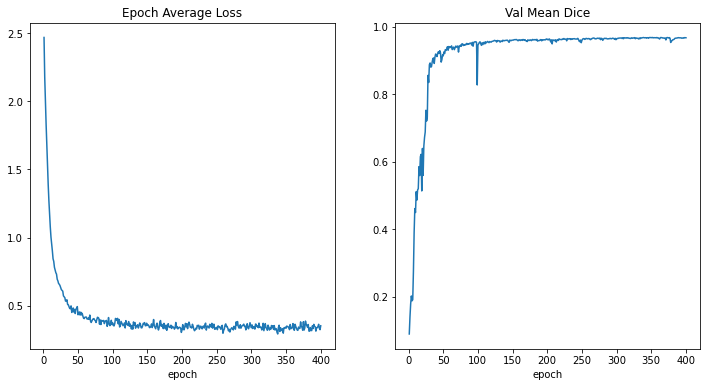

In [18]:
plt.figure("train", (12, 6))
plt.subplot(1, 2, 1)
plt.title("Epoch Average Loss")
x = [i + 1 for i in range(len(epoch_loss_values))]
y = epoch_loss_values
plt.xlabel("epoch")
plt.plot(x, y)

plt.subplot(1, 2, 2)
plt.title("Val Mean Dice")
x = [val_interval * (i + 1) for i in range(len(metric_values))]
y = metric_values
plt.xlabel("epoch")
plt.plot(x, y)
plt.show()

## Check best model output with the input image and label

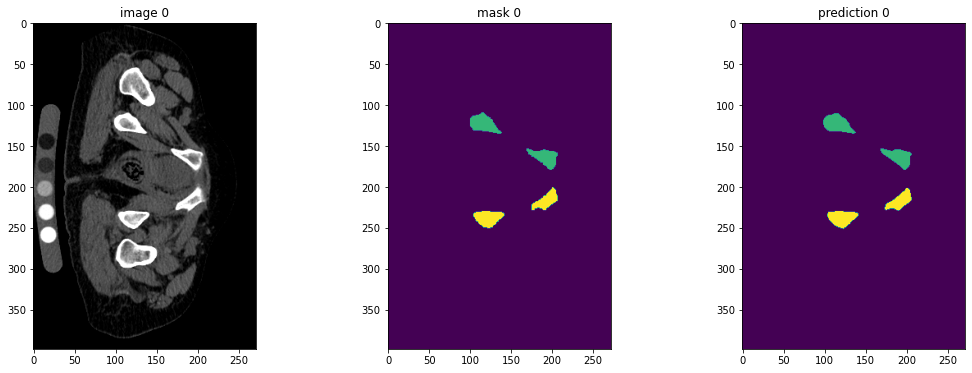

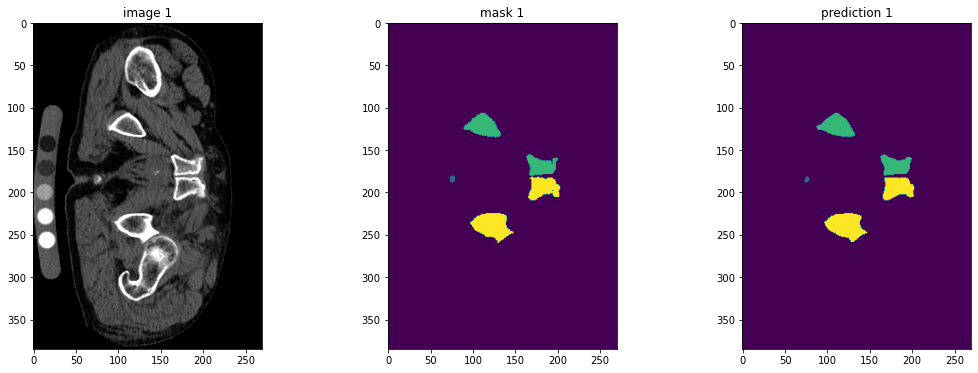

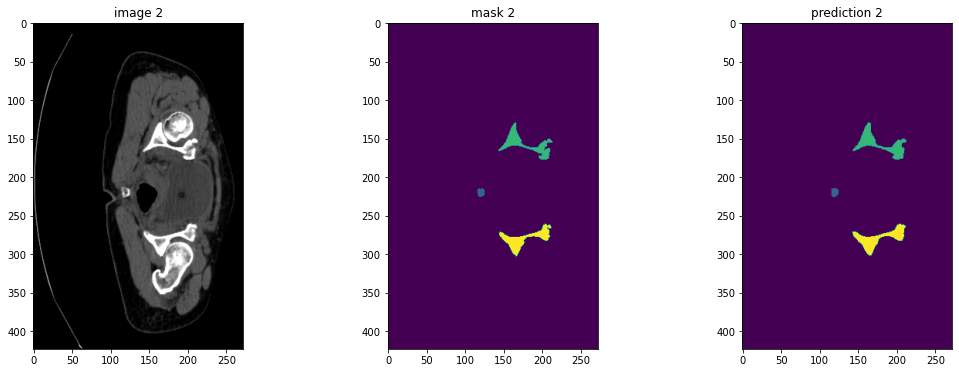

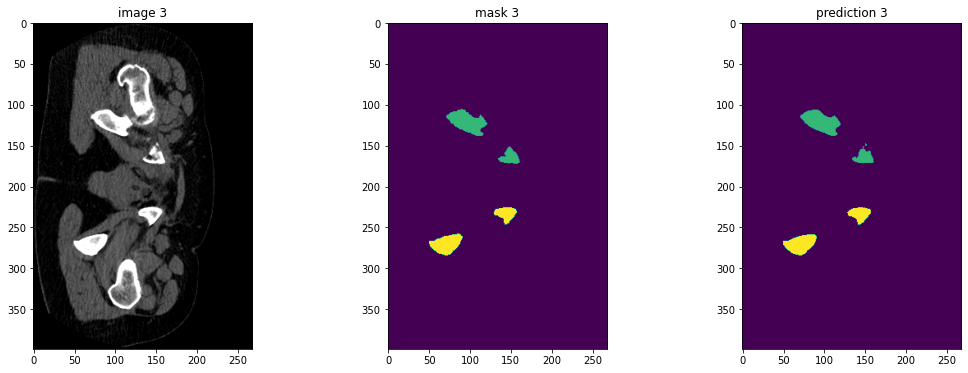

In [19]:
model.load_state_dict(torch.load(os.path.join(root_dir, "best_metric_model.pth")))
model.eval()

with torch.no_grad():
    for i, val_data in enumerate(val_loader):
        
        val_inputs = val_data["image"].to(device)
        val_outputs = inference(val_inputs)
        
        # plot the slice [:, :, 80]
        plt.figure("check", (18, 6))
        
        plt.subplot(1, 3, 1)
        plt.title(f"image {i}")
        plt.imshow(val_data["image"][0, 0, :, :, 80], cmap="gray")
        
        plt.subplot(1, 3, 2)
        plt.title(f"mask {i}")
        plt.imshow(val_data["mask"][0, 0, :, :, 80])
        
        plt.subplot(1, 3, 3)
        plt.title(f"prediction {i}")
        plt.imshow(torch.argmax(val_outputs, dim=1).detach().cpu()[0, :, :, 80])
        
        plt.show()
        if i == 3:
            break

## Evaluation of Model on original image spacing

In [20]:
test_image = os.path.join(root_dir, 'test_images')
test_mask = os.path.join(root_dir, 'test_masks')

In [21]:
test_images = sorted(glob.glob(os.path.join(test_image, "*data.nii.gz")))
test_labels = sorted(glob.glob(os.path.join(test_mask , "*mask_4label.nii.gz")))

test_dicts = [ {"image": image_name, "mask": label_name} for image_name, label_name in zip(test_images, test_labels) ]
test_files = test_dicts[:]

In [22]:
test_transforms = Compose([
        LoadImaged(keys=["image", "mask"]),
        EnsureChannelFirstd(keys=["image", "mask"]),
        Orientationd(keys=["image"], axcodes="RAS"),
        Spacingd(keys=["image"], pixdim=(1.0, 1.0, 1.0), mode="bilinear"),
        ScaleIntensityRanged(keys=["image"], a_min=-120, a_max=360,b_min=0.0, b_max=1.0, clip=True,),
        CropForegroundd(keys=["image"], source_key="image"),
        EnsureTyped(keys=["image", "mask"]),
    ])

In [23]:
test_ds = Dataset(data=test_files, transform=test_transforms)
test_loader  = DataLoader(test_ds, batch_size=1, num_workers=0)

# test_ds = CacheDataset(data=test_files, transform=test_transforms, cache_rate=1.0, num_workers=0)
# test_loader = DataLoader(test_ds, batch_size=1, num_workers=0)

In [24]:
post_transforms = Compose([
    EnsureTyped(keys="pred"),
    Invertd(keys="pred", transform=test_transforms, orig_keys="image", meta_keys="pred_meta_dict", 
            orig_meta_keys="image_meta_dict", meta_key_postfix="meta_dict", nearest_interp=False,to_tensor=True,),
    AsDiscreted(keys="pred", argmax=True, to_onehot=5),
    AsDiscreted(keys="mask", to_onehot=5),
])

In [25]:
model.load_state_dict(torch.load(os.path.join(root_dir, "best_metric_model.pth")))
model.eval()

with torch.no_grad():
    for test_data in test_loader:
        
        test_inputs = test_data["image"].to(device)
        roi_size = (160, 160, 160)
        sw_batch_size = 4
        test_data["pred"] = sliding_window_inference(test_inputs, roi_size, sw_batch_size, model,sw_device="cuda:0", device="cpu")
        #uses cuda to run network(window_data) and uses cpu memory to store the final predicted volume
        
        test_data = [post_transforms(i) for i in decollate_batch(test_data)]
        test_outputs, test_labels = from_engine(["pred", "mask"])(test_data)
        
        # compute metric for current iteration
        dice_metric(y_pred=test_outputs, y=test_labels)

    # aggregate the final mean dice result
    metric_test = dice_metric.aggregate().item()
    # reset the status for next validation round
    #dice_metric.reset()

#print("Metric on original image spacing: ", metric_test)
print (dice_metric.get_buffer())

#test_data["pred"] = inference(test_inputs)


tensor([[0.9475, 0.9781, 0.9757, 0.9450],
        [0.9824, 0.9820, 0.9885, 0.9779],
        [0.9633, 0.9740, 0.9648, 0.9660],
        [0.9547, 0.9638, 0.9691, 0.9774],
        [0.9461, 0.9816, 0.9335, 0.9670],
        [0.9602, 0.9827, 0.9820, 0.9750],
        [0.9812, 0.9816, 0.9792, 0.9800],
        [0.9717, 0.9866, 0.9903, 0.9767],
        [0.9404, 0.9878, 0.9878, 0.9687],
        [0.9678, 0.9737, 0.9753, 0.9687],
        [0.9730, 0.9847, 0.9861, 0.9701],
        [0.9769, 0.9367, 0.9734, 0.9702],
        [0.9759, 0.9595, 0.9695, 0.9826],
        [0.9543, 0.9833, 0.9815, 0.9718],
        [0.9800, 0.9882, 0.9801, 0.9780],
        [0.9514, 0.9843, 0.9817, 0.9608],
        [0.9785, 0.9825, 0.9873, 0.9737],
        [0.9766, 0.9833, 0.9895, 0.9801],
        [0.9710, 0.9801, 0.9842, 0.9678],
        [0.9020, 0.9661, 0.9803, 0.9504]])


In [26]:
print("Metric on original image spacing: ", metric_test)

Metric on original image spacing:  0.9720433950424194


In [27]:
#print(dice_metric(y_pred=test_outputs, y=test_labels)) #each individual score

In [28]:
#dice_metric.get_buffer() #check all calculated scores

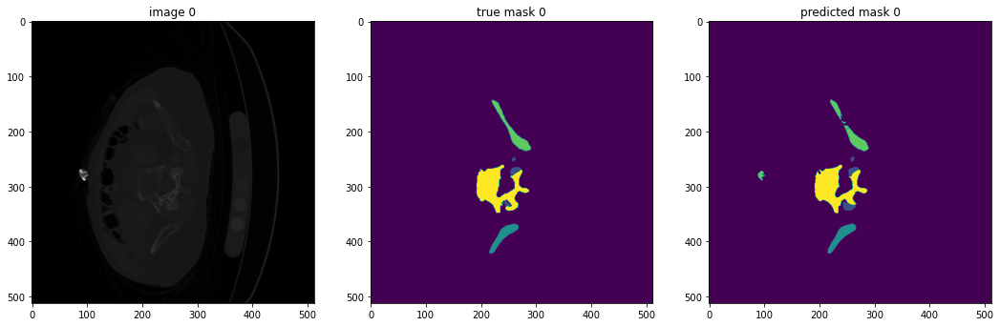

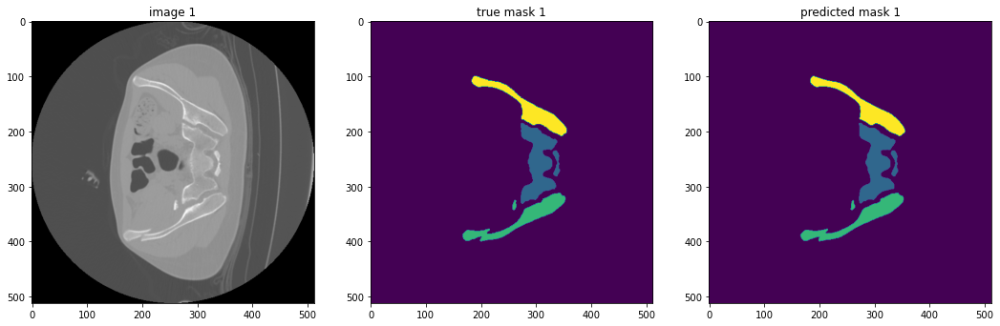

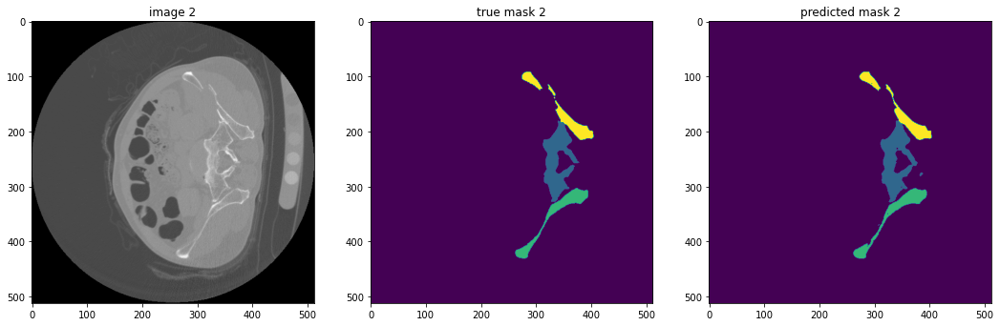

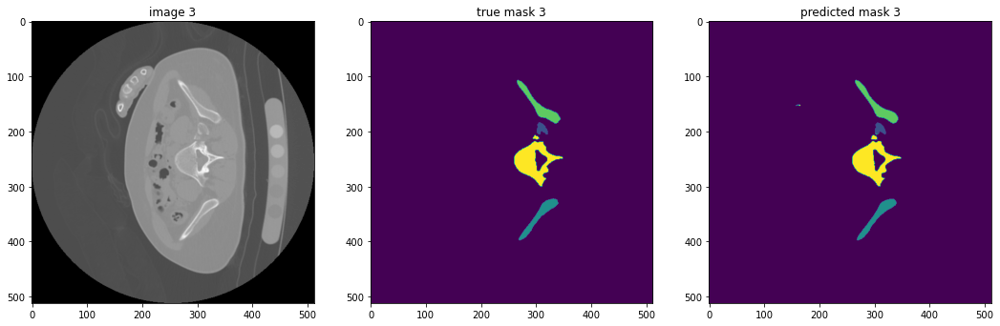

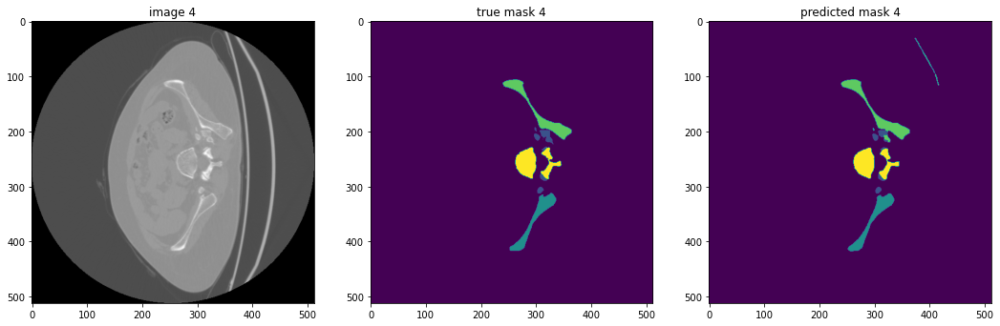

...

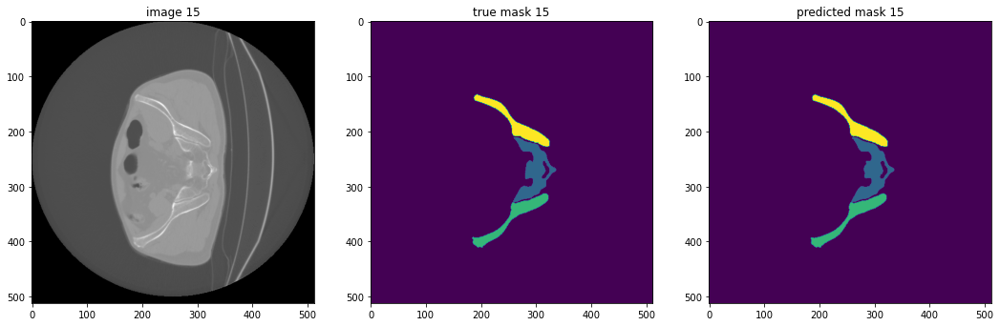

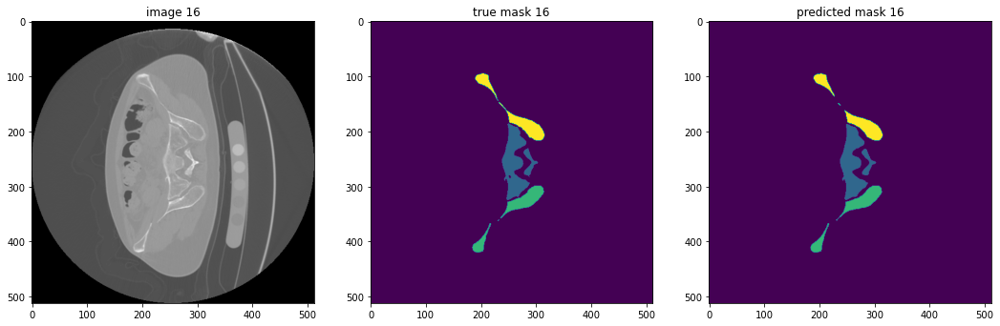

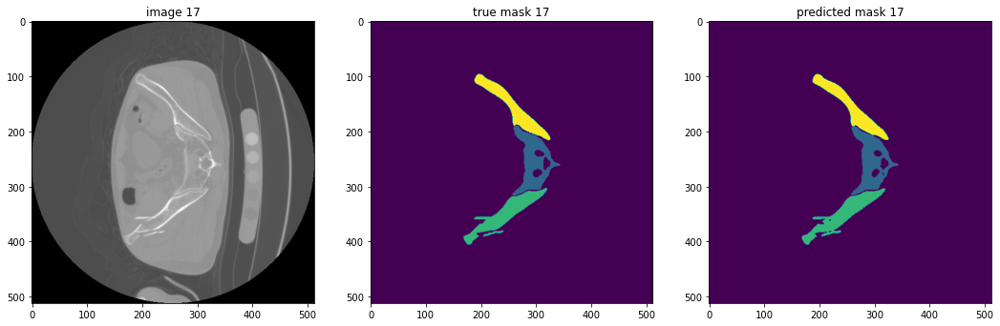

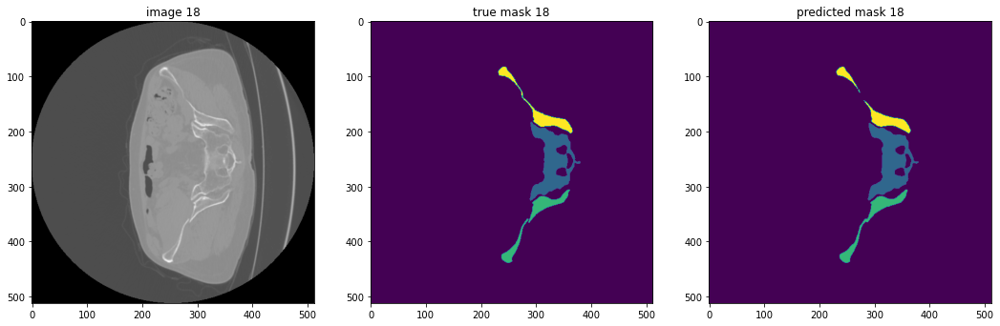

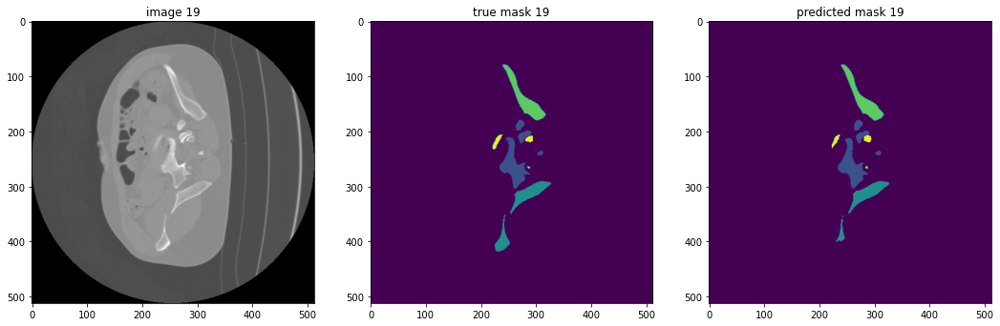

In [29]:
from monai.transforms import LoadImage
loader = LoadImage()

model.load_state_dict(torch.load(os.path.join(root_dir, "best_metric_model.pth")))
model.eval()

with torch.no_grad():
    for i, test_data in enumerate(test_loader):
        test_inputs = test_data["image"].to(device)
        roi_size = (160, 160, 160)
        sw_batch_size = 4
        test_data["pred"] = sliding_window_inference(test_inputs, roi_size, sw_batch_size, model,sw_device="cuda:0", device="cpu")
        test_data = [post_transforms(i) for i in decollate_batch(test_data)]
        test_outputs, test_labels = from_engine(["pred", "mask"])(test_data)
        original_image = loader(test_data[0]["image_meta_dict"]["filename_or_obj"])[0]
        
        plt.figure("check", (18, 6))
        plt.subplot(1, 3, 1)
        plt.title(f"image {i}")
        plt.imshow(original_image[:, :, 250], cmap="gray")
        plt.subplot(1, 3, 2)
        plt.title(f"true mask {i}")
        plt.imshow(torch.argmax(test_labels[0], dim=0).detach().cpu()[:, :, 250])
        plt.subplot(1, 3, 3)
        plt.title(f"predicted mask {i}")
        plt.imshow(torch.argmax(test_outputs[0], dim=0).detach().cpu()[:, :, 250])
        plt.show()
        if i == 19:
            break

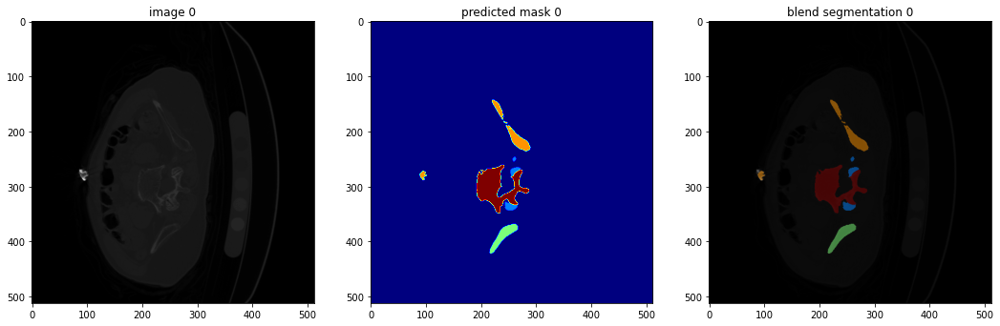

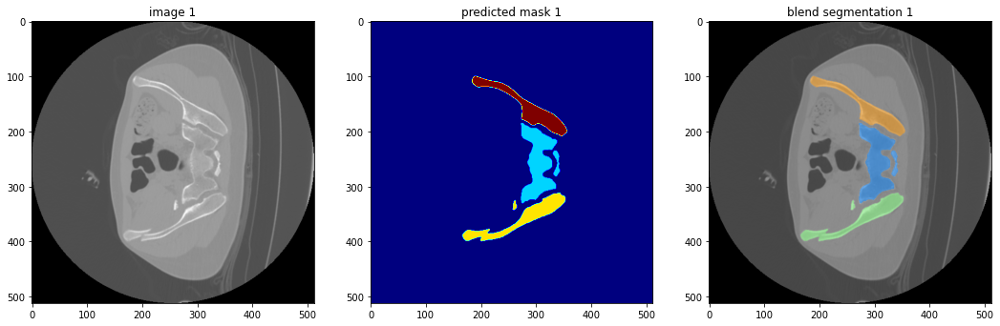

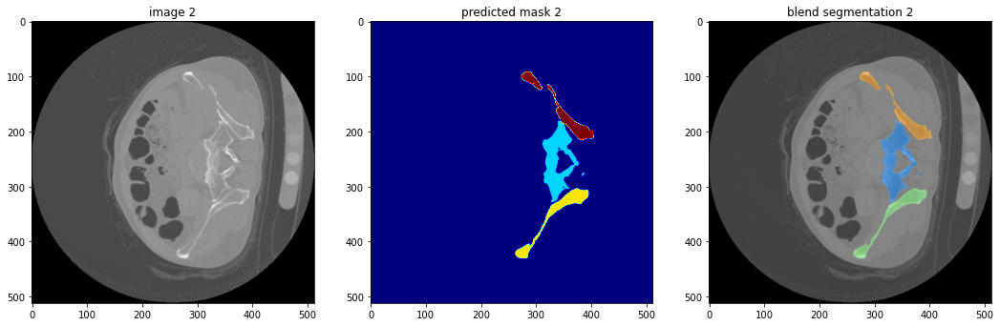

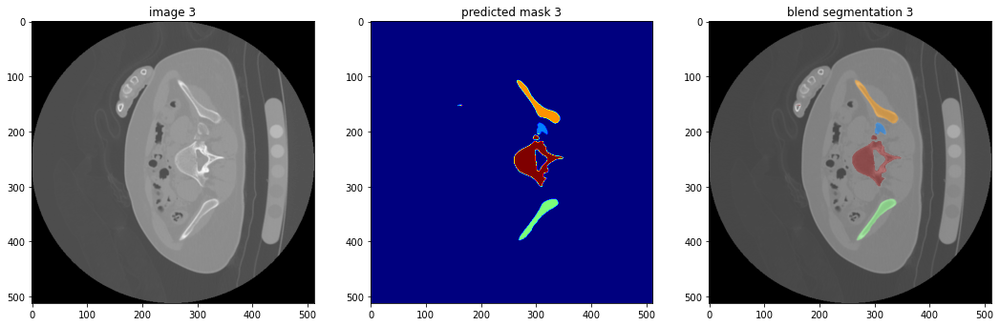

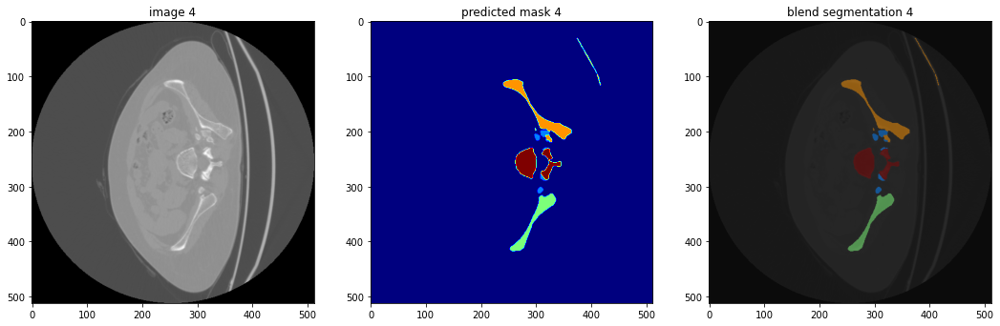

...

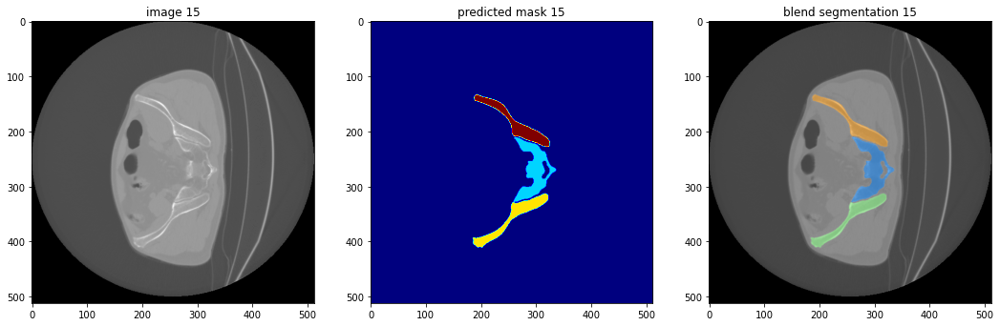

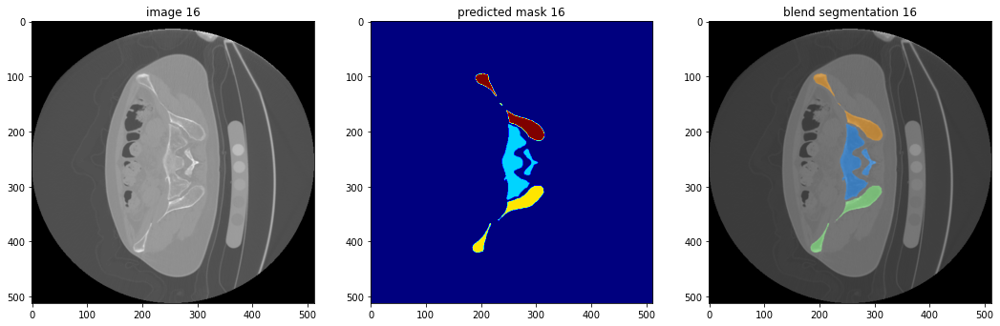

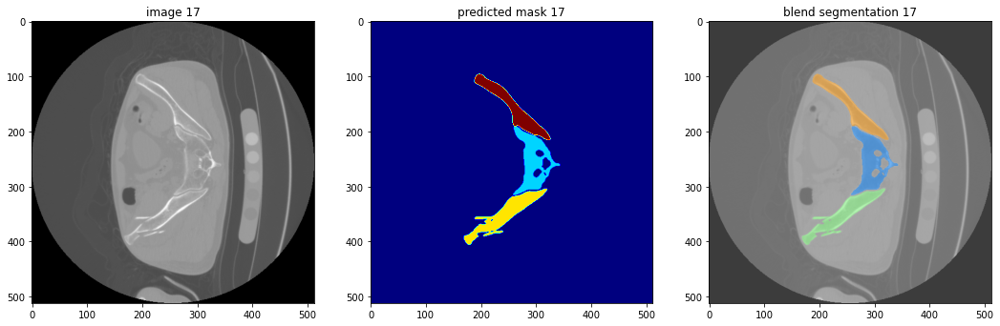

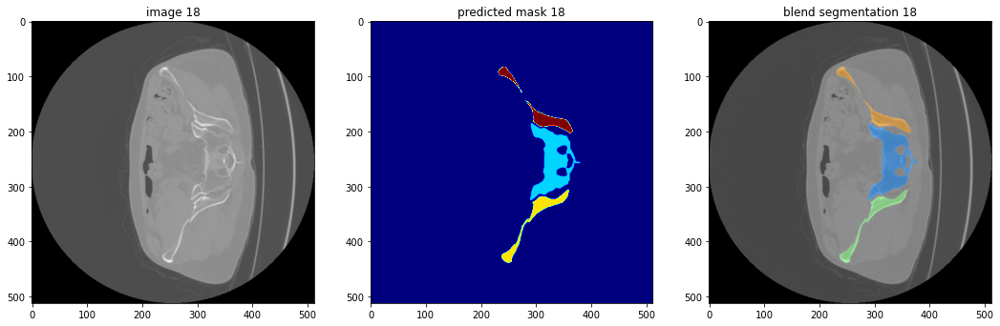

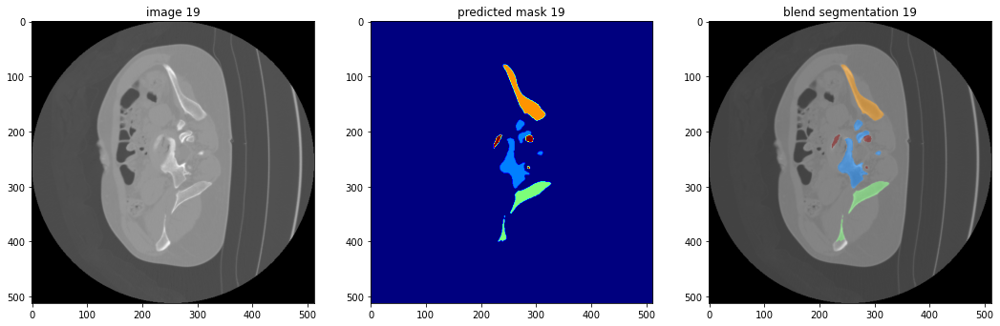

In [30]:
from monai.transforms import LoadImage
loader = LoadImage()

model.load_state_dict(torch.load(os.path.join(root_dir, "best_metric_model.pth")))
model.eval()

with torch.no_grad():
    for i, test_data in enumerate(test_loader):
        test_inputs = test_data["image"].to(device)
        roi_size = (160, 160, 160)
        sw_batch_size = 4
        test_data["pred"] = sliding_window_inference(test_inputs, roi_size, sw_batch_size, model,sw_device="cuda:0", device="cpu")
        test_data = [post_transforms(i) for i in decollate_batch(test_data)]
        test_outputs, test_labels = from_engine(["pred", "mask"])(test_data)
        original_image = loader(test_data[0]["image_meta_dict"]["filename_or_obj"])[0]
        test_output_argmax = torch.argmax(test_outputs[0], dim=0, keepdim=True)
        rety = blend_images(image=original_image[None], label=test_output_argmax, cmap="jet", alpha=0.5, rescale_arrays=True)
        
        plt.figure("check", (18, 6))
        plt.subplot(1, 3, 1)
        plt.title(f"image {i}")
        plt.imshow(original_image[None][ 0, :, :, 250], cmap="gray")
        plt.subplot(1, 3, 2)
        plt.title(f"predicted mask {i}")
        plt.imshow(test_output_argmax [ 0, :, :, 250],  cmap="jet")
        plt.subplot(1, 3, 3)
        plt.title(f"blend segmentation {i}")
        plt.imshow(torch.moveaxis(rety[:, :, :, 250], 0, -1))
        plt.show()
        if i == 19:
            break 
        

## 3D Visualization

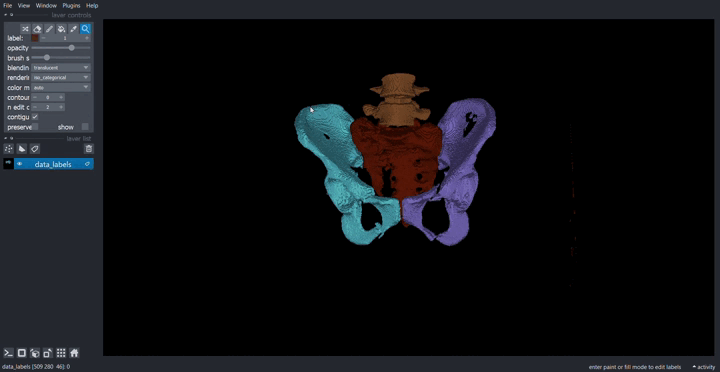

In [31]:
from IPython.display import Image
Image('../projects/72_GIF.gif')

In [32]:
"""
0: background,
1: sacrum,
2: right_hip,
3: left_hip,
4: lumbar_vertebra.        
""" 

'\n0: background,\n1: sacrum,\n2: right_hip,\n3: left_hip,\n4: lumbar_vertebra.        \n'

In [2]:
import nibabel
import napari
import numpy as np

# load image as integers
image = 'E:/Seg_400_CE_with_artefacts/dataset6_CLINIC_0059_data/dataset6_CLINIC_0059_data_seg.nii.gz'
data = nibabel.load(image).get_fdata().astype(int)

# multiply each label by an increasing number
data_multiplied = data * np.arange(data.shape[-1])

# sum along the channel axis. 
# labels are not overlapped, we get 0 if no label was found or the label's index where a label is found
data_labels = data_multiplied.sum(axis=-1)

v = napari.Viewer(ndisplay=3)
v.add_labels(data_labels)

<Labels layer 'data_labels' at 0x149fef59340>